<a href="https://colab.research.google.com/github/huangning265-creator/geophysics-class-2025/blob/main/pygmt_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PyGMT 0.17 no Google Colab

> ⚠️ **Nota:** Há uma incompatibilidade temporária no sistema de resolução do conda/mamba no Colab (a versão do Python em uso é **3.12.11**, mas o solver pode conter um *pin* interno diferente).  
> Por isso, para instalar o PyGMT é necessário usar uma versão compatível do **condacolab** (ou ajustar o arquivo `pinned` do conda para **python=3.12**).  
> Depois disso, o **PyGMT 0.17** instala e executa normalmente. Isso será corrigido em uma atualização futura do Colab.


In [1]:
!pip install condacolab --quiet
# need to install condacolab for a python 3.11 pin
import condacolab
condacolab.install_from_url("https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh")

✨🍰✨ Everything looks OK!


**Don't PANIC !** The kernel will restart automatically.

After that, install `pygmt` normally.

In [2]:
!mamba install pygmt --quiet # <--- it takes around 1 minute

warning  libmamba [numpy-2.3.5-py312h33ff503_0] The following files were already present in the environment:
    - bin/f2py
    - bin/numpy-config


In [3]:
import pygmt
pygmt.show_versions()

PyGMT information:
  version: v0.17.0
System information:
  python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
  executable: /usr/bin/python3.real
  machine: Linux-6.6.105+-x86_64-with-glibc2.35
Dependency information:
  numpy: 2.3.5
  pandas: 2.3.3
  xarray: 2025.11.0
  packaging: 25.0
  contextily: None
  geopandas: 1.1.1
  IPython: 7.34.0
  pyarrow: 18.1.0
  rioxarray: None
  gdal: 3.11.0
  ghostscript: 10.06.0
GMT library information:
  version: 6.5.0
  padding: 2
  share dir: /usr/local/share/gmt
  plugin dir: /usr/local/lib/gmt/plugins
  library path: /usr/local/lib/libgmt.so
  cores: 2
  grid layout: rows
  image layout: 
  binary version: 6.5.0


In [13]:
from pygmt.datasets import load_earth_relief

# Adjust resolution for finer detail (e.g., '03m' for 3-minute resolution)
grid = load_earth_relief(resolution='03m', registration='pixel')

fig = pygmt.Figure()
# Set region and projection for Taiwan
fig.basemap(region='118/123/21/26', projection='M12c', frame=True)
fig.grdimage(grid, cmap='geo', shading=True)
fig.coast(resolution='f', shorelines=True)
# Removing hotspots for a regional map of Taiwan unless specifically requested
# fig.plot(data='@hotspots.txt', style='c0.2c', fill='red')
fig.colorbar()
fig.show()

GMTInvalidInput: The 'region' parameter is required for IGPP Earth relief resolution '03m'.

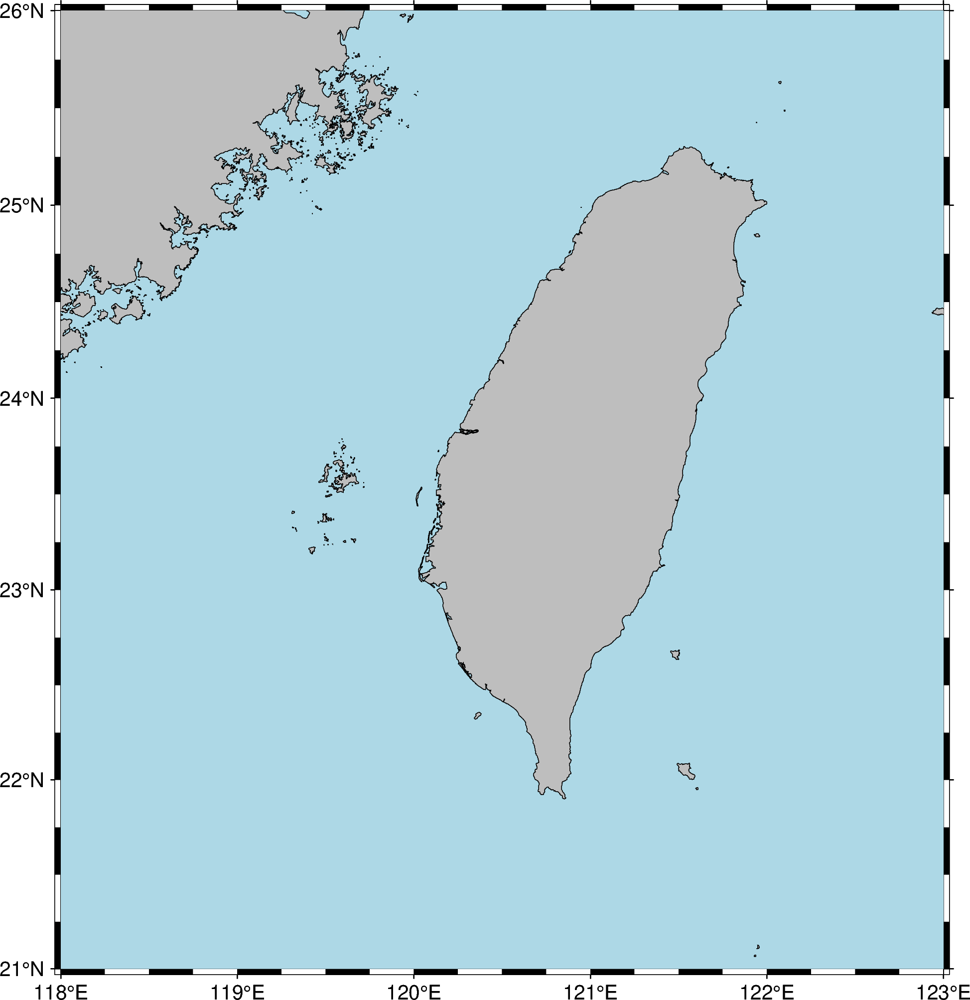

In [10]:
fig = pygmt.Figure()
fig.basemap(region="118/123/21/26", projection="M15c", frame=True)
fig.coast(shorelines=True, land='gray', water='lightblue',resolution='full')
fig.show()

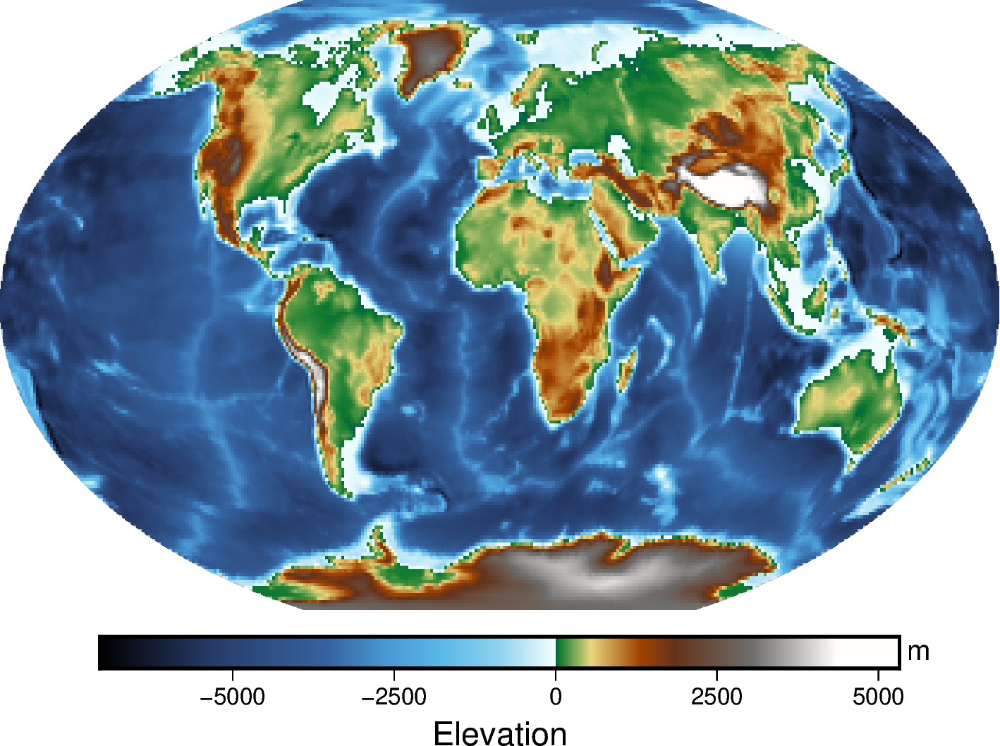

In [14]:
fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="R12c", cmap="geo")
fig.colorbar(frame=["a2500", "x+lElevation", "y+lm"])
fig.show()

In [16]:
# Colab 專用的安裝指令 (前面要加驚嘆號 !)
!pip install pygmt pandas

地形圖

下載地形資料，解析度: 01m...
地形資料下載完成。
地形圖已儲存為 philippine_sea_terrain.png


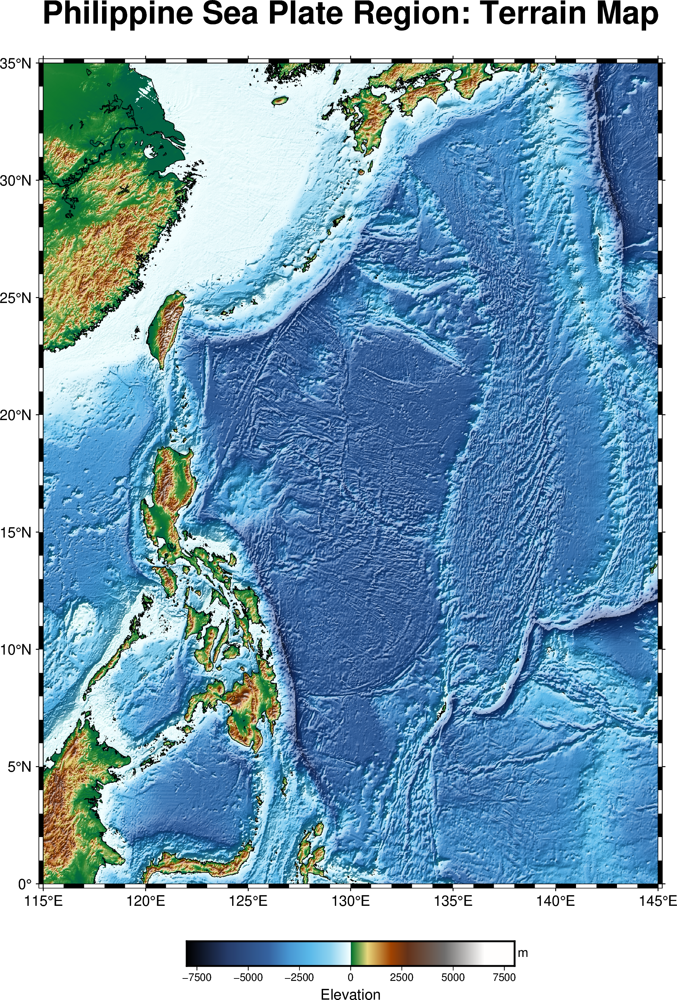

In [33]:
import pygmt

def plot_philippine_sea_terrain(
    plot_region=(115, 145, 0, 35),
    grid_resolution="01m",
    output_filename="philippine_sea_terrain.png"
):
    fig = pygmt.Figure()

    print(f"下載地形資料，解析度: {grid_resolution}...")
    grid = pygmt.datasets.load_earth_relief(
        resolution=grid_resolution,
        region=plot_region,
        registration="gridline"
    )
    print("地形資料下載完成。")

    # 使用 X 投影避免巨大空白
    fig.grdimage(
        grid=grid,
        region=plot_region,
        projection="X15c/20c",   # <-- 關鍵修正
        cmap="geo",
        shading="+a150+ne0.7"
    )

    fig.coast(
        region=plot_region,
        projection="X15c/20c",
        shorelines=True,
        frame=["a5f1", "x+lLongitude", "y+lLatitude", "+tPhilippine Sea Plate Region: Terrain Map"]
    )

    # 將長條圖改為橫向，並放置在底部中央
    fig.colorbar(
        cmap="geo",
        frame=["a2500", "x+lElevation", "y+lm"],
        position="JBC+w8c/0.6c+h" # Changed position to Bottom Center, horizontal
    )

    fig.savefig(output_filename, crop=True)
    print(f"地形圖已儲存為 {output_filename}")
    fig.show()

if __name__ == "__main__":
    region = (115, 145, 0, 35)
    plot_philippine_sea_terrain(plot_region=region)

In [22]:
# 在 Colab 先安裝
!apt-get -qq install -y libgmt-dev gmt
!pip install -q pygmt


Selecting previously unselected package gmt-common.
(Reading database ... 121713 files and directories currently installed.)
Preparing to unpack .../0-gmt-common_6.4.0+dfsg-2~jammy1_all.deb ...
Unpacking gmt-common (6.4.0+dfsg-2~jammy1) ...
Selecting previously unselected package libfftw3-single3:amd64.
Preparing to unpack .../1-libfftw3-single3_3.3.8-2ubuntu8_amd64.deb ...
Unpacking libfftw3-single3:amd64 (3.3.8-2ubuntu8) ...
Selecting previously unselected package libgmt6:amd64.
Preparing to unpack .../2-libgmt6_6.4.0+dfsg-2~jammy1_amd64.deb ...
Unpacking libgmt6:amd64 (6.4.0+dfsg-2~jammy1) ...
Selecting previously unselected package gmt.
Preparing to unpack .../3-gmt_6.4.0+dfsg-2~jammy1_amd64.deb ...
Unpacking gmt (6.4.0+dfsg-2~jammy1) ...
Selecting previously unselected package libgmt-dev.
Preparing to unpack .../4-libgmt-dev_6.4.0+dfsg-2~jammy1_amd64.deb ...
Unpacking libgmt-dev (6.4.0+dfsg-2~jammy1) ...
Selecting previously unselected package gmt-dcw.
Preparing to unpack .../5-gm

火山+一般地震+歷史大地震

載入地形網格（earth_relief）...
輸出檔案: philippine_sea_with_volcanoes_quakes.png


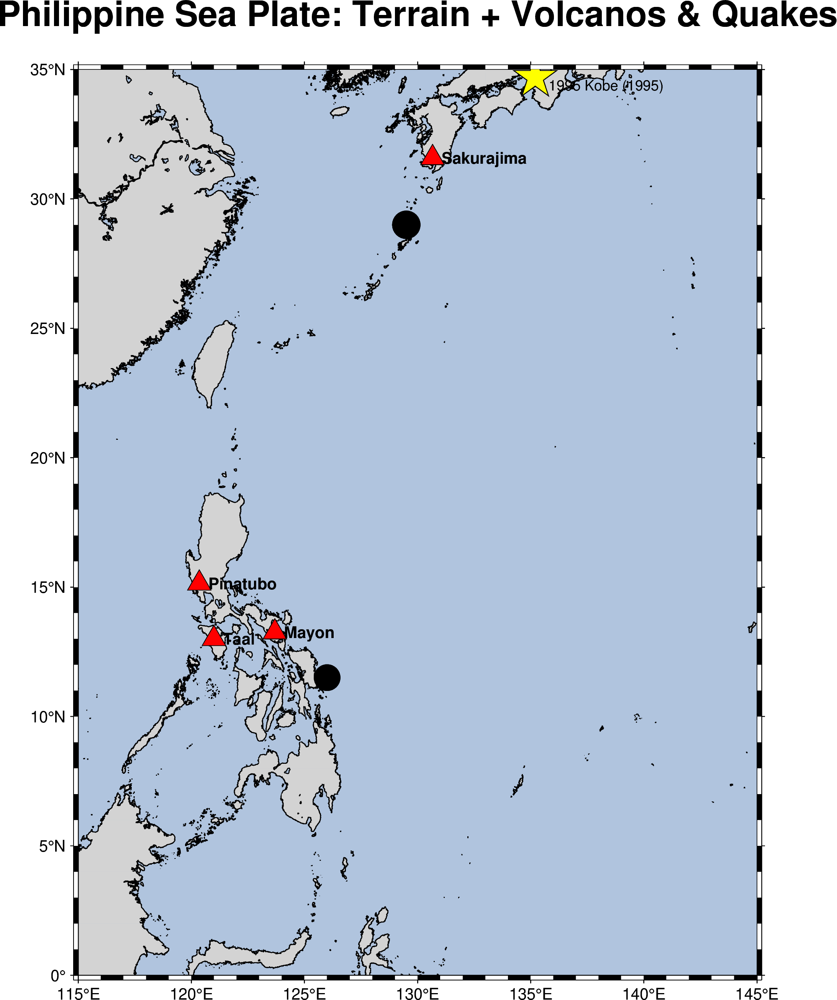

In [34]:
import pygmt
import numpy as np

def plot_philippine_sea_with_overlays(
    plot_region=(115, 145, 0, 35),
    grid_resolution="01m",
    output_filename="philippine_sea_with_overlays.png",
    volcanoes=None,
    earthquakes=None,
    historic_quakes=None
):
    """
    在菲律賓海板塊基底地形上疊加 火山、地震、歷史地震。
    volcanoes: list of dicts with keys: name, lon, lat
    earthquakes: list of dicts with keys: lon, lat, mag, depth
    historic_quakes: list of dicts with keys: name, lon, lat, year, mag (optional)
    """
    fig = pygmt.Figure()

    # 1) 下載地形
    print("載入地形網格（earth_relief）...")
    grid = pygmt.datasets.load_earth_relief(
        resolution=grid_resolution,
        region=plot_region,
        registration="gridline"
    )

    # 2) 繪地形底圖（使用 X 投影指定寬/高以避免空白）
    fig.grdimage(
        grid=grid,
        region=plot_region,
        projection="X15c/20c",
        cmap="oleron", # Changed to a less saturated colormap for terrain
        shading="+a150+ne0.7"
    )

    # 3) 海岸線與框線
    fig.coast(
        region=plot_region,
        projection="X15c/20c",
        shorelines="0.5p,black",
        land='lightgray', # Less saturated land color
        water='lightsteelblue', # Less saturated water color
        frame=["a5f1", "x+lLongitude", "y+lLatitude", "+tPhilippine Sea Plate: Terrain + Volcanos & Quakes"]
    )

    # 4) 如果有地震資料，先做 depth -> color scale
    if earthquakes:
        # 準備 earthquake color palette by depth (shallow -> deep)
        depths = np.array([eq["depth"] for eq in earthquakes])
        depth_min, depth_max = float(np.nanmin(depths)), float(np.nanmax(depths))
        # 若所有深度相同則擴張範圍一點
        if depth_min == depth_max:
            depth_min -= 1
            depth_max += 1
        pygmt.makecpt(cmap="viridis", series=f"{depth_min}/{depth_max}/1", continuous=True)

        # plot earthquakes: size ~ mag, color ~ depth
        for eq in earthquakes:
            lon, lat = eq["lon"], eq["lat"]
            mag = eq.get("mag", 4.0)
            depth = eq.get("depth", 10.0)
            # 將震級對應到符號大小（可調） - Adjusted scaling for slightly larger circles
            size = 0.3 + 0.1 * (mag - 4.0) # mag4 -> ~0.3c, mag6.5 -> ~0.55c, mag9.1 -> ~0.91c
            fig.plot(x=lon, y=lat, style=f"c{size}c", fill=depth, pen="0.2p,black", cmap=True)

        # colorbar for depth - Changed to horizontal at bottom center
        # fig.colorbar(frame=["a10", "x+lDepth (km)"], position="JBC+w8c/0.6c+h")

    # 5) 畫火山（紅色上三角），並標名字
    if volcanoes:
        volc_lons = [v["lon"] for v in volcanoes]
        volc_lats = [v["lat"] for v in volcanoes]
        # plot all volcanoes at once (triangle up, red) - Adjusted size
        fig.plot(x=volc_lons, y=volc_lats, style="t0.6c", fill="red", pen="0.3p,black")
        # add labels offset a bit to the right
        for v in volcanoes:
            fig.text(x=v["lon"] + 0.4, y=v["lat"], text=v["name"], font="10p,Helvetica-Bold,black", justify="ML")

    # 6) 歷史著名地震（黃色五角星）並標註年份/名稱
    if historic_quakes:
        for h in historic_quakes:
            lon, lat = h["lon"], h["lat"]
            label = f"{h.get('year','?')} {h.get('name','')}"
            size = 1.0  # Adjusted size for historic events
            # Changed style to 'a' for star and fill to 'yellow'
            fig.plot(x=lon, y=lat, style=f"a{size}c", fill="yellow", pen="0.4p,black")
            # label
            fig.text(x=lon + 0.6, y=lat - 0.3, text=label, font="9p,Helvetica,black", justify="ML")

    # 7) 儲存與顯示
    fig.savefig(output_filename, crop=True)
    print(f"輸出檔案: {output_filename}")
    fig.show()

# ---------------------------
# 範例資料（你可以直接替換成真實檔或 CSV）
# ---------------------------

# 火山（範例座標，精確度可再替換）
volcanoes_sample = [
    {"name": "Mayon", "lon": 123.6856, "lat": 13.2575},
    {"name": "Taal", "lon": 120.9936, "lat": 13.0021},
    {"name": "Pinatubo", "lon": 120.3483, "lat": 15.1425},
    {"name": "Sakurajima", "lon": 130.6575, "lat": 31.5856},  # 鹿兒島 (南日本)
]

# 近期地震資料（範例；lon, lat, magnitude, depth (km)）
earthquakes_sample = [
    {"lon": 142.369, "lat": 38.322, "mag": 9.1, "depth": 29},   # 2011 Tohoku (示例)
    {"lon": 137.0, "lat": 36.0, "mag": 6.5, "depth": 10},
    {"lon": 126.0, "lat": 11.5, "mag": 6.8, "depth": 60},
    {"lon": 129.5, "lat": 29.0, "mag": 7.2, "depth": 45},
]

# 歷史著名地震（示例座標，請依作業需求替換）
historic_quakes_sample = [
    {"name": "Tohoku (2011)", "lon": 142.369, "lat": 38.322, "year": 2011, "mag": 9.1},
    {"name": "Kobe (1995)", "lon": 135.1955, "lat": 34.6901, "year": 1995, "mag": 7.3},
    {"name": "Great Kanto (1923)", "lon": 139.6425, "lat": 35.4478, "year": 1923, "mag": 7.9},
]

# ---------------------------
# 執行繪圖
# ---------------------------
if __name__ == "__main__":
    region = (115, 145, 0, 35)
    plot_philippine_sea_with_overlays(
        plot_region=region,
        grid_resolution="01m",
        output_filename="philippine_sea_with_volcanoes_quakes.png",
        volcanoes=volcanoes_sample,
        earthquakes=earthquakes_sample,
        historic_quakes=historic_quakes_sample
    )

### 🌊 Aproveite o PyGMT 🌍  
Crie mapas e figuras incríveis diretamente no seu **notebook do Colab** —  
com o poder do **PyGMT 0.17.0**, **GMT** e **Python 3.12**. Veja mais exemplos em [**Recursos Externos do PyGMT**](https://www.pygmt.org/v0.17.0/external_resources.html).

> _Boas mapas!_ 🗺️
